In [1]:
# get the environment
import sys
print(sys.version)
print(sys.executable)
import os
os.getcwd()

3.7.11 (default, Jul 27 2021, 09:42:29) [MSC v.1916 64 bit (AMD64)]
C:\Users\bbutler\MyStuff\Anaconda3\envs\reticulate\python.exe


'C:\\Users\\bbutler\\MyStuff\\MiscMarketing\\WebsiteFeedback'

In [2]:
# Standard imports
import sys
import warnings
warnings.simplefilter('ignore')
import os
import pandas as pd
import numpy as np

# plotting
from pylab import rcParams

import textwrap
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud, STOPWORDS # preprocessing prior to lda

# improve with plotly
import plotly.offline as pyo
from plotly.offline import iplot, init_notebook_mode
import plotly.graph_objs as go
from plotly.offline import init_notebook_mode
import plotly.express as px
# print('Seaborn Version: ', sns.__version__)

# get UMAP for dimension reduction
import umap


%matplotlib inline

# for dendograms
from scipy.cluster.hierarchy import dendrogram, linkage
from scipy.cluster import hierarchy

# get the lDA algorithm
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.model_selection import GridSearchCV

# text libraries
import re
import nltk
from sklearn.feature_extraction.text import CountVectorizer
from nltk.sentiment.vader import SentimentIntensityAnalyzer

# use the TF-IDF vectorizor to give more weight to rare words
# TF-IDF specific setup
from sklearn.feature_extraction.text import TfidfVectorizer

# set seed for reproducibility
SEED = 42


# for other work
import fnmatch


# for dendograms
from scipy.cluster.hierarchy import dendrogram, linkage
from scipy.cluster import hierarchy

# get the lDA algorithm
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.model_selection import GridSearchCV

# text libraries
import nltk
# nltk.download('stopwords')
from wordcloud import WordCloud, STOPWORDS # preprocessing prior to lda

# use the TF-IDF vectorizor to give more weight to rare words
# TF-IDF specific setup
from sklearn.feature_extraction.text import TfidfVectorizer

# tranformer pipeline for sentiment
from transformers import pipeline

# TF imports
import tensorflow_hub as hub
import tensorflow as tf

In [30]:
# set up directories
# os.chdir('C:\\Users\\bbutler\\MyStuff\\MiscMarketing\\WebsiteFeedback\\RawData')
data_dir = 'C:\\Users\\bbutler\\MyStuff\\MiscMarketing\\WebsiteFeedback\\RawData'
# plot_dir = 'M:\\bbutler\\DataScience\\NLP\\WebsiteFeedback\\Plots'
plot_dir = 'C:\\Users\\bbutler\\MyStuff\\MiscMarketing\\WebsiteFeedback\\Plots'


In [4]:
# get the CSV files only
os.chdir(data_dir)
files = fnmatch.filter(os.listdir('.'), '*.csv')
files

['Feedback Form Submissions 1.21.22.csv',
 'Feedback Form Submissions 1.25-1.31.22.csv',
 'Feedback Form Submissions 1.31-2.4.22.csv',
 'Feedback Form Submissions 2.11-2.18.22.csv',
 'Feedback Form Submissions 2.18-2.25.22.csv',
 'Feedback Form Submissions 2.25-3.8.22.csv',
 'Feedback Form Submissions 2.4.22-2.11.22.csv']

In [5]:
# create cleaner names for files in dictionary
# as this list of files grows, keep appending new data
# use a simple format
names = []
for i in range(0,len(files)):
    names.append('data' + str(i))
names

['data0', 'data1', 'data2', 'data3', 'data4', 'data5', 'data6']

In [15]:
# i is the incrementor for the list of names
i = 0

# iterate through the file names
for file in files:
    # make an empty dataframe
    df = pd.DataFrame()
    # load the first file in
    df = pd.read_csv(file, low_memory=False)
    # get the first name from the list, this will be a string
    new_name = names[i]
    # assign the string to the variable and assign it to the dataframe 
    locals()[new_name] = df.copy()
    # increment the list of names
    i = i + 1

# Use a Dictionary to Store & Compare DFs

In [6]:
# load them in via dictionary
dfs = {}

# this creates a dictionary of dataframes
for file in files:
    dfs[file] = pd.read_csv(file, low_memory=False)

In [7]:
dfs = dict(zip(names, files))
dfs

{'data0': 'Feedback Form Submissions 1.21.22.csv',
 'data1': 'Feedback Form Submissions 1.25-1.31.22.csv',
 'data2': 'Feedback Form Submissions 1.31-2.4.22.csv',
 'data3': 'Feedback Form Submissions 2.11-2.18.22.csv',
 'data4': 'Feedback Form Submissions 2.18-2.25.22.csv',
 'data5': 'Feedback Form Submissions 2.25-3.8.22.csv',
 'data6': 'Feedback Form Submissions 2.4.22-2.11.22.csv'}

In [8]:
# now load the data in cleanly
for df in dfs.keys():
    dfs[df] = pd.read_csv(dfs[df], low_memory=False)

In [9]:
for k in dfs.keys():
    print(k, dfs[k].shape)

data0 (194, 23)
data1 (235, 23)
data2 (143, 23)
data3 (409, 22)
data4 (318, 23)
data5 (336, 23)
data6 (235, 22)


# Build Main Dataframe

In [16]:
# this checks for the IP address column then removes it

for i in range(0,len(names)):
        
    # get the first name from the list, this will be a string
    new_name = names[i]
    # assign the string to the variable and assign it to the dataframe
    if 'Remote IP address' in locals()[new_name].columns:
        print("Remote IP address exists in ", new_name, " removing now ...")
        locals()[new_name] = locals()[new_name].drop('Remote IP address', axis = 1)
    else:
        print("Remote IP address does not exist in ", new_name)

Remote IP address exists in  data0  removing now ...
Remote IP address exists in  data1  removing now ...
Remote IP address exists in  data2  removing now ...
Remote IP address does not exist in  data3
Remote IP address exists in  data4  removing now ...
Remote IP address exists in  data5  removing now ...
Remote IP address does not exist in  data6


In [17]:
# use a loop to concatenate all dataframes

df_list = []
for i in range(0,len(names)):
    df = names[i]
    df_list.append(locals()[df])
    
# now append the list
all_data = pd.concat(df_list, axis = 0)
all_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1870 entries, 0 to 234
Data columns (total 22 columns):
 #   Column                                                   Non-Null Count  Dtype  
---  ------                                                   --------------  -----  
 0   Serial number                                            1870 non-null   int64  
 1   Submission ID                                            1870 non-null   int64  
 2   Submission URI                                           1869 non-null   object 
 3   Created                                                  1870 non-null   object 
 4   Completed                                                1870 non-null   object 
 5   Changed                                                  1870 non-null   object 
 6   Is draft                                                 1870 non-null   int64  
 7   Current page                                             0 non-null      float64
 8   Submitted by: ID             

In [18]:
# key key fields
key_data = all_data[['Submission ID', 'Submission URI','Created',
                     'Did you find what you were looking for on this webpage?',
                     'Please tell us what you were looking for.']]

key_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1870 entries, 0 to 234
Data columns (total 5 columns):
 #   Column                                                   Non-Null Count  Dtype 
---  ------                                                   --------------  ----- 
 0   Submission ID                                            1870 non-null   int64 
 1   Submission URI                                           1869 non-null   object
 2   Created                                                  1870 non-null   object
 3   Did you find what you were looking for on this webpage?  1692 non-null   object
 4   Please tell us what you were looking for.                910 non-null    object
dtypes: int64(1), object(4)
memory usage: 87.7+ KB


In [19]:
# clean up names
new_names = ['ID', 'Page', 'Date', 'FindLookingFor', 'LookingFor']
key_data.columns = new_names
key_data.head()

,ID,Page,Date,FindLookingFor,LookingFor
0,287926,/business-banking-bill-pay-error?status=16&sp=...,1/24/2022 12:07,No,I am enrolled in Bill Pay. It stopped working ...
1,287586,/commercial,1/22/2022 9:53,No,how do i set up my commercial online banking
2,287731,/credit-card-online-account-access,1/22/2022 21:31,No,Credit card account on line login can not do w...
3,287776,/credit-card-online-account-access,1/23/2022 12:58,No,telephone number visa card
4,287496,/customer-service,1/21/2022 19:53,No,Account information.


In [20]:
# make a date
key_data['Date'] = pd.to_datetime(key_data['Date']).dt.date
key_data.head()

,ID,Page,Date,FindLookingFor,LookingFor
0,287926,/business-banking-bill-pay-error?status=16&sp=...,2022-01-24,No,I am enrolled in Bill Pay. It stopped working ...
1,287586,/commercial,2022-01-22,No,how do i set up my commercial online banking
2,287731,/credit-card-online-account-access,2022-01-22,No,Credit card account on line login can not do w...
3,287776,/credit-card-online-account-access,2022-01-23,No,telephone number visa card
4,287496,/customer-service,2022-01-21,No,Account information.


In [21]:
key_data['Date'] = pd.to_datetime(key_data['Date'], format = '%Y-%m-%d')
key_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1870 entries, 0 to 234
Data columns (total 5 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   ID              1870 non-null   int64         
 1   Page            1869 non-null   object        
 2   Date            1870 non-null   datetime64[ns]
 3   FindLookingFor  1692 non-null   object        
 4   LookingFor      910 non-null    object        
dtypes: datetime64[ns](1), int64(1), object(3)
memory usage: 87.7+ KB


In [22]:
key_data.head()

,ID,Page,Date,FindLookingFor,LookingFor
0,287926,/business-banking-bill-pay-error?status=16&sp=...,2022-01-24,No,I am enrolled in Bill Pay. It stopped working ...
1,287586,/commercial,2022-01-22,No,how do i set up my commercial online banking
2,287731,/credit-card-online-account-access,2022-01-22,No,Credit card account on line login can not do w...
3,287776,/credit-card-online-account-access,2022-01-23,No,telephone number visa card
4,287496,/customer-service,2022-01-21,No,Account information.


In [23]:
plot_data = key_data[['Date', 'FindLookingFor']]
plot_data.head()

,Date,FindLookingFor
0,2022-01-24,No
1,2022-01-22,No
2,2022-01-22,No
3,2022-01-23,No
4,2022-01-21,No


In [24]:
plot_data['Count'] = 1
plot_data.head()

,Date,FindLookingFor,Count
0,2022-01-24,No,1
1,2022-01-22,No,1
2,2022-01-22,No,1
3,2022-01-23,No,1
4,2022-01-21,No,1


In [25]:
# make aggegate of Yes and no
yes_no = pd.DataFrame(plot_data.groupby(['Date', 'FindLookingFor']).aggregate({'Count' : np.sum}))
yes_no.head()

Count
Date       FindLookingFor       
2022-01-20 Yes                 2
2022-01-21 No                 14
           Yes                62
2022-01-22 No                 19
           Yes                26

In [26]:
yes_no = yes_no.reset_index()
yes_no.head()

,Date,FindLookingFor,Count
0,2022-01-20,Yes,2
1,2022-01-21,No,14
2,2022-01-21,Yes,62
3,2022-01-22,No,19
4,2022-01-22,Yes,26


In [27]:
# colors: dark blue,  sienna, blue, light blue, grey, green, 
colors = ["#04183C", "#E88202",  "#2A66DE", "#33BBFF", "#BAC2C6", "#179110"]

In [28]:
fig = px.bar(yes_no, x="Date",
             y="Count",
             color="FindLookingFor",
             title="Success Rates",
                color_discrete_map={
                    'No': colors[1],
                    'Yes': colors[0]},
            template="simple_white")

fig.update_xaxes(
    dtick=48*60*60*1000,
    tickformat="%b-%d",
    tickangle=-45)


fig.show()

In [31]:
# save the file


file_name = plot_dir + '\\' + 'timeSeries.html'
pyo.plot(fig, filename=file_name, auto_open=False)

'C:\\Users\\bbutler\\MyStuff\\MiscMarketing\\WebsiteFeedback\\Plots\\timeSeries.html'

In [32]:
# clean the page urls
key_data['Page'] = key_data['Page'].str.replace(r'(^.*403.*)', '/Broken-Link')
key_data['Page'] = key_data['Page'].str.replace(r'(^.*geo.*)', '/Map')

regex_pat = re.compile(r'\?.*', flags=re.IGNORECASE)
key_data['Page'] = key_data['Page'].str.replace(regex_pat, '', regex=True)

In [33]:
plot_data = key_data[['Page', 'FindLookingFor']]
plot_data['Count'] = 1
plot_data.head()

,Page,FindLookingFor,Count
0,/business-banking-bill-pay-error,No,1
1,/commercial,No,1
2,/credit-card-online-account-access,No,1
3,/credit-card-online-account-access,No,1
4,/customer-service,No,1


In [34]:
# make aggegate of Yes and no
page_plot = pd.DataFrame(plot_data.groupby(['Page', 'FindLookingFor']).aggregate({'Count' : np.sum}))
page_plot.head()

Count
Page                              FindLookingFor       
/Broken-Link                      No                 78
                                  Yes               504
/Map                              No                 35
                                  Yes                15
/account-number-banking-statement No                  1

In [35]:
page_plot = page_plot.reset_index()

page_plot = page_plot.sort_values(by=['Count'],ascending=[False])

page_plot.head(10)

,Page,FindLookingFor,Count
1,/Broken-Link,Yes,504
173,/search,No,115
0,/Broken-Link,No,78
34,/customer-service,No,65
97,/online-banking,No,51
9,/alerts,No,40
104,/online-services-0,No,39
2,/Map,No,35
16,/business-banking-bill-pay-error,Yes,35
67,/general-banking-faqs,No,32


In [36]:
fig = px.bar(page_plot.iloc[0:20,0:], x="Count",
             y="Page",
             color="FindLookingFor",
             title="Success Rates by Page (Top 20)",
                color_discrete_map={
                    'No': colors[1],
                    'Yes': colors[0]},
            template="simple_white")

fig.update_layout(barmode='stack', yaxis={'categoryorder':'total ascending'})

fig.show()

In [37]:
# save the file

file_name = plot_dir + '\\' + 'pageCounts.html'
pyo.plot(fig, filename=file_name, auto_open=False)

'C:\\Users\\bbutler\\MyStuff\\MiscMarketing\\WebsiteFeedback\\Plots\\pageCounts.html'

# Begin NLP

In [38]:
text = key_data[['Page', 'LookingFor']]

# rename the columns
text.columns = ["Page", 'Comments']

# lots of NaN only get clean text
df = text[text['Comments'].notna()]
df.head()

,Page,Comments
0,/business-banking-bill-pay-error,I am enrolled in Bill Pay. It stopped working ...
1,/commercial,how do i set up my commercial online banking
2,/credit-card-online-account-access,Credit card account on line login can not do w...
3,/credit-card-online-account-access,telephone number visa card
4,/customer-service,Account information.


In [39]:
stopwords = nltk.corpus.stopwords.words('english')

In [40]:
to_keep = ["couldn", "couldn't", "didn", "didn't", "doesn", "doesn't", "no", "more", "not", "can't",
           "cannot", "isn't", "aren't", "wasn't","weren't", "hasn't", "haven't", "hadn't", "doesn't",
           "don't", "didn't", "won't", "dont", "ain", "arent", "aren't", "hasn", "mightn", "mightn't",
           "mustn", "mustn't", 'on']

to_add = ['eastern', 'bank']


# remove the negative connotation stopwords
# check if to keep in the list, if so remove it
# print("Stopwords length: ", len(stopwords))
for word in to_keep:
    if word in stopwords:
        # print(word, " in stopwords, removing  ...")
        stopwords.remove(word)
    else:
        pass
        #print(word, " not in stopwords")

# add in eastern bank        
# print("Stopwords length: ", len(stopwords))    
for word in to_add:
    #print("Adding ", word)
    stopwords.append(word)
    
# print("Stopwords length: ", len(stopwords))

In [41]:
# Additional Cleaning of Text
# Remove numbers
df['Clean_Comments'] = df['Comments'].replace(r'\d+','', regex=True, inplace=True)

# Remove punctuation
punct_pat = re.compile(r'[-()\"#/@;:<>{}+=~\.//,]', flags=re.IGNORECASE)
df['Clean_Comments'] = df['Comments'].str.replace(punct_pat, '', regex=True)

# convert to lower
# df['Clean_Comments'] = df['Clean_Comments'].str.lower()

df.head(10)

,Page,Comments,Clean_Comments
0,/business-banking-bill-pay-error,I am enrolled in Bill Pay. It stopped working ...,I am enrolled in Bill Pay It stopped working i...
1,/commercial,how do i set up my commercial online banking,how do i set up my commercial online banking
2,/credit-card-online-account-access,Credit card account on line login can not do w...,Credit card account on line login can not do w...
3,/credit-card-online-account-access,telephone number visa card,telephone number visa card
4,/customer-service,Account information.,Account information
5,/customer-service,Where can I contact you for information on inc...,Where can I contact you for information on inc...
6,/debit-alerts,Vacation notification,Vacation notification
7,/direct-deposit,i needed to speak to someone about ordering de...,i needed to speak to someone about ordering de...
8,/eastern-bank-zelle,What is the max $ amount you can send through ...,What is the max $ amount you can send through ...
9,/eastern-bank-zelle,What are the transfer limits per day,What are the transfer limits per day


In [ ]:
# export the df
df.to_csv('comments.csv', index = False)

# Use CountVectorizer for Processing Comments into Bigrams
## Begin Cleaning Text

In [42]:
# set up for Bi-Grams

cv = CountVectorizer(max_df = 0.95, min_df=2, stop_words=stopwords, ngram_range=(2, 2))

In [43]:
# make document term matrix
dtm = cv.fit_transform(df['Clean_Comments'])
dtm

<910x254 sparse matrix of type '<class 'numpy.int64'>'
	with 717 stored elements in Compressed Sparse Row format>

In [44]:
dtm.shape

(910, 254)

In [45]:
# convert to dataframe for clustering
bow = pd.DataFrame(dtm.toarray(), columns = cv.get_feature_names())
bow

,access account,account balance,account holder,account information,account number,account on,account online,account per,ach transfer,activate debit,...,want log,want look,want make,want stop,website not,wire transfer,wire transfers,would like,years ago,zelle transfer
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
905,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
906,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
907,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
908,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [46]:
bow['Page'] = df['Page'].values

In [47]:
# collapse it down
pageDf = bow.groupby(['Page']).sum()

In [48]:
# sum across rows
pageDf['Total'] = pageDf.sum(axis=1)
pageDf = pageDf.sort_values(by=['Total'],ascending=[False])
pageDf.head(25)

,access account,account balance,account holder,account information,account number,account on,account online,account per,ach transfer,activate debit,...,want look,want make,want stop,website not,wire transfer,wire transfers,would like,years ago,zelle transfer,Total
Page,,,,,,,,,,,,,,,,,,,,,
/search,1,0,1,0,0,0,0,0,0,2,...,0,0,0,0,0,0,1,1,1,142
/customer-service,0,0,0,1,0,0,0,1,0,0,...,0,0,0,1,2,0,1,0,0,96
/Broken-Link,0,1,0,1,0,1,0,0,0,0,...,0,1,1,0,0,0,0,0,0,56
/online-banking,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,2,0,49
/online-services-0,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,1,0,1,0,0,37
/alerts,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,26
/general-banking-faqs,0,0,1,0,0,0,1,1,0,0,...,0,0,0,0,0,1,0,0,0,24
/business-banking-bill-pay-error,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,23
/Map,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,21


In [114]:
# export df
file_name = plot_dir + '\\' + 'pageDf.csv'
pageDF.to_csv(file_name)

In [49]:
pageDF = pageDf.drop('Total', axis=1)
pageDF.info()

<class 'pandas.core.frame.DataFrame'>
Index: 126 entries, /search to /apple-pay
Columns: 254 entries, access account to zelle transfer
dtypes: int64(254)
memory usage: 251.0+ KB


In [50]:
page_red = pageDf.iloc[0:25,0:]

In [104]:
page_red = page_red.drop('Total', axis=1)
page_red.head()

,access account,account balance,account holder,account information,account number,account on,account online,account per,ach transfer,activate debit,...,want log,want look,want make,want stop,website not,wire transfer,wire transfers,would like,years ago,zelle transfer
Page,,,,,,,,,,,,,,,,,,,,,
/search,1,0,1,0,0,0,0,0,0,2,...,0,0,0,0,0,0,0,1,1,1
/customer-service,0,0,0,1,0,0,0,1,0,0,...,0,0,0,0,1,2,0,1,0,0
/Broken-Link,0,1,0,1,0,1,0,0,0,0,...,0,0,1,1,0,0,0,0,0,0
/online-banking,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,1,2,0
/online-services-0,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,1,0,1,0,0


In [105]:
# Calculate the distance between each sample
Z = linkage(page_red, 'ward')

In [106]:
# check the pages
l = list(page_red.index)

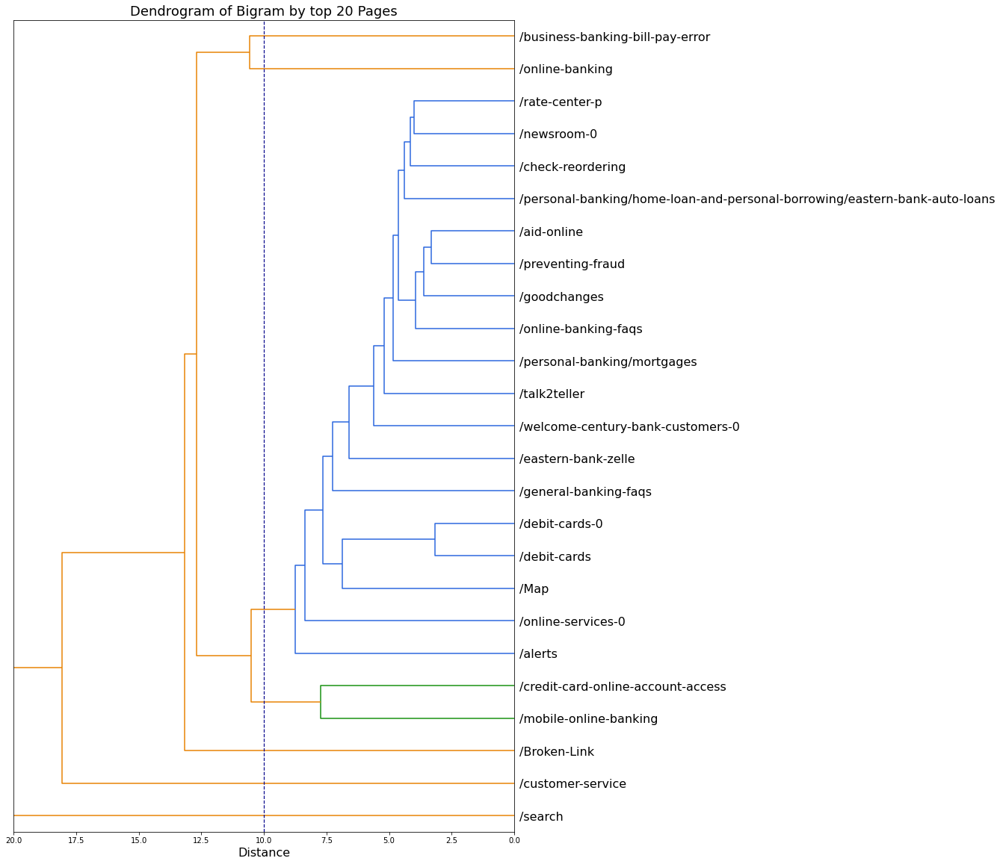

In [111]:
# set the threshold to color
# colors: dark blue,  sienna, blue, light blue, grey, green, 
colors = ["#04183C", "#E88202",  "#2A66DE", "#33BBFF", "#BAC2C6", "#179110"]



# hierarchy.set_link_color_palette(['green', 'darkgrey', 'darkblue']) 
hierarchy.set_link_color_palette([colors[5], colors[2], colors[0]]) 

t = 10.0

plt.figure(figsize=(12,20))
dendrogram(Z, labels=l, leaf_rotation=0, leaf_font_size=16,
           orientation="left",
           color_threshold=t,
           above_threshold_color="#E88202")
plt.axvline(x=t, c='darkblue', lw=1.2, linestyle='dashed')
plt.title('Dendrogram of Bigram by top 20 Pages', fontsize=18)
# plt.xlabel('Page')
plt.xlabel('Distance', fontsize=16)
plt.xlim([20, 0])

# save the file
file_name = plot_dir + '\\' + 'dendrogram.png'
plt.savefig(file_name, bbox_inches='tight')

plt.show()



# Topic Modeling with LDA

In [56]:
# function to do a grid search of params
def cv_lda(data_in):
    search_params = {'n_components':[4, 6, 8], "learning_decay":[0.3, 0.5, 0.7]}
    
    # initialize model
    LDA = LatentDirichletAllocation(random_state = SEED)
    
    # init grid search class
    model = GridSearchCV(LDA, param_grid = search_params).fit(data_in)
    
    # return best model
    print("Best Model's Params: ", model.best_params_)
    print("\nBest Log Likelihood: ", model.best_score_)
    print("\nBest Perplexity: ", model.best_estimator_.perplexity(data_in))
    model.best_estimator_

In [57]:
model = cv_lda(dtm)

Best Model's Params:  {'learning_decay': 0.3, 'n_components': 4}

Best Log Likelihood:  -1413.809419906606

Best Perplexity:  474.63148645695134


In [58]:
LDA = LatentDirichletAllocation(n_components=4, random_state=SEED, learning_decay=0.3)
LDA.fit(dtm)

LatentDirichletAllocation(learning_decay=0.3, n_components=4, random_state=42)

In [59]:
for index,topic in enumerate(LDA.components_):
    print(f'THE TOP 50 BIGRAMS WORDS FOR TOPIC #{index}')
    print([cv.get_feature_names()[i] for i in topic.argsort()[-50:]])
    print('\n')

THE TOP 50 BIGRAMS WORDS FOR TOPIC #0
['looking tax', 'east boston', 'fax number', 'make account', 'account number', 'branch near', 'wire transfers', 'update password', 'branches salem', 'lien release', 'trying log', 'first time', 'on page', 'check deposits', 'on card', 'transfer money', 'already enrolled', 'terms conditions', 'not authorized', 'card activation', 'please advise', 'personal account', 'loan information', 'problem signing', 'signing mobile', 'activate debit', 'want stop', 'pin on', 'new account', 'logging online', 'tax form', 'card number', 'card account', 'open new', 'pay bills', 'access account', 'every time', 'change pin', 'mobile app', 'on debit', 'report lost', 'enroll online', 'need help', 'interest rates', 'wire transfer', 'lost debit', 'email address', 'on line', 'online banking', 'debit card']


THE TOP 50 BIGRAMS WORDS FOR TOPIC #1
['ppp loan', 'login account', 'salem mass', 'overdraft not', 'want log', 'customer statement', 'swampscott branch', 'deposit informa

In [60]:
# outputs the probability of being in a group
topic_results = LDA.transform(dtm)
topic_results.shape

(910, 4)

In [61]:
# create a column for the topic assignment

df['Topic'] = topic_results.argmax(axis=1)
df.head(10)

,Page,Comments,Clean_Comments,Topic
0,/business-banking-bill-pay-error,I am enrolled in Bill Pay. It stopped working ...,I am enrolled in Bill Pay It stopped working i...,2
1,/commercial,how do i set up my commercial online banking,how do i set up my commercial online banking,0
2,/credit-card-online-account-access,Credit card account on line login can not do w...,Credit card account on line login can not do w...,0
3,/credit-card-online-account-access,telephone number visa card,telephone number visa card,1
4,/customer-service,Account information.,Account information,3
5,/customer-service,Where can I contact you for information on inc...,Where can I contact you for information on inc...,1
6,/debit-alerts,Vacation notification,Vacation notification,0
7,/direct-deposit,i needed to speak to someone about ordering de...,i needed to speak to someone about ordering de...,0
8,/eastern-bank-zelle,What is the max $ amount you can send through ...,What is the max $ amount you can send through ...,0
9,/eastern-bank-zelle,What are the transfer limits per day,What are the transfer limits per day,2


# Make Wordcloud Topics

In [62]:
def get_words_freq(new_dtm):
    sum_words = new_dtm.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in cv.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq

In [63]:
# Generating wordcloud and saving as png image
def plot_cloud(title, words_freq, filename):
    plt.figure(figsize=(16,10))
    
    title = 'Most frequently occurring bigrams connected by same colour and font size for ' + title

    words_dict = dict(words_freq)
    WC_height = 1500
    # WC_width = 2000
    WC_max_words = 500
    # wordCloud = WordCloud(max_words=WC_max_words, height=WC_height, width=WC_width,stopwords=stopwords)
    wordCloud = WordCloud(max_words=WC_max_words,stopwords=stopwords)
    wordCloud.generate_from_frequencies(words_dict)
    plt.title(title, fontsize=24)
    plt.imshow(wordCloud, interpolation='bilinear')
    plt.axis("off")
    
    # save the file
    # save the file
    file_name = plot_dir + '\\' + filename + '.png'
    plt.savefig(file_name, bbox_inches='tight')
    
    plt.show()

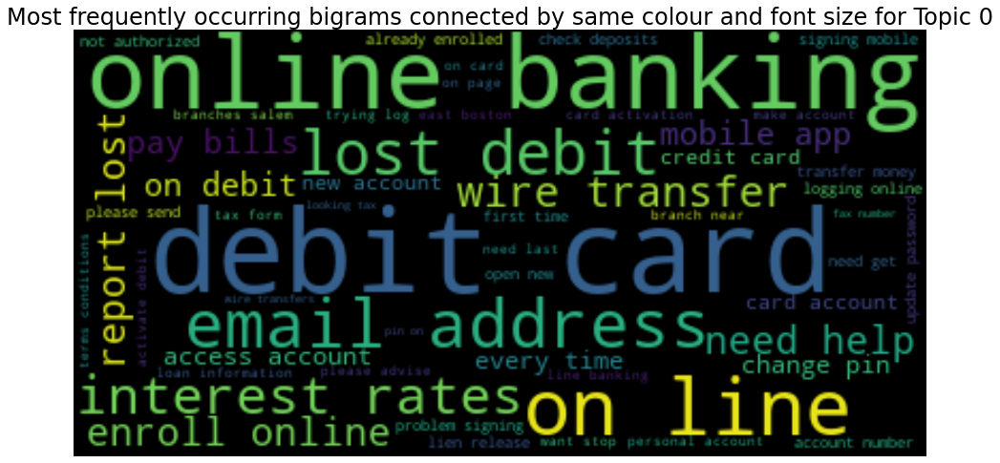

In [64]:
# topic 0
# make document term matrix

df0 = df[df['Topic'] == 0]
dtm0 = cv.fit_transform(df0['Clean_Comments'])
wf = get_words_freq(dtm0)
plot_cloud("Topic 0", wf, 'topic0')

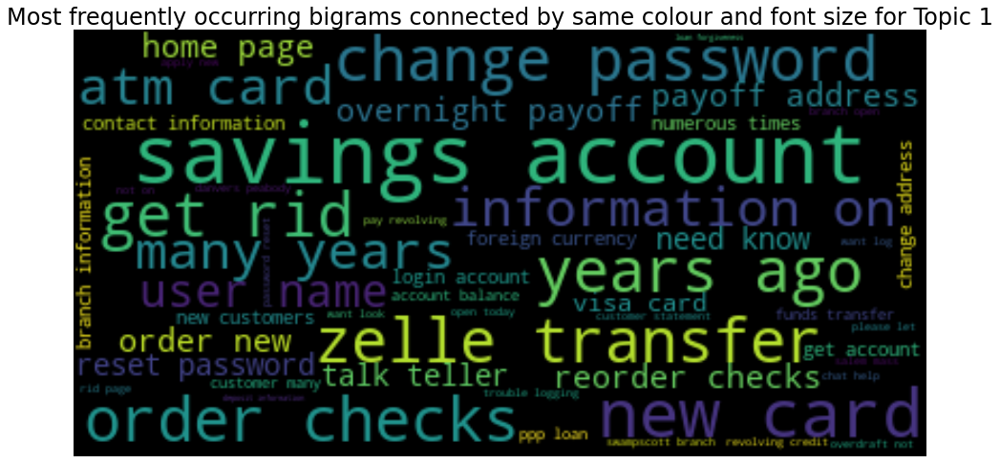

In [65]:
# topic 1
# make document term matrix

df1 = df[df['Topic'] == 1]
dtm1 = cv.fit_transform(df1['Clean_Comments'])

wf = get_words_freq(dtm1)
plot_cloud("Topic 1", wf, 'topic1')

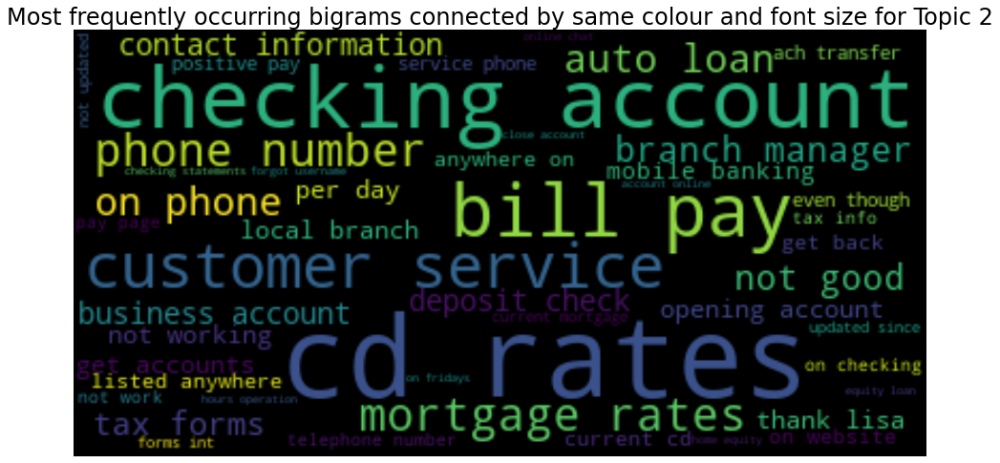

In [66]:
df2 = df[df['Topic'] == 2]
dtm2 = cv.fit_transform(df2['Clean_Comments'])

wf = get_words_freq(dtm2)
plot_cloud("Topic 2", wf, 'topic2')

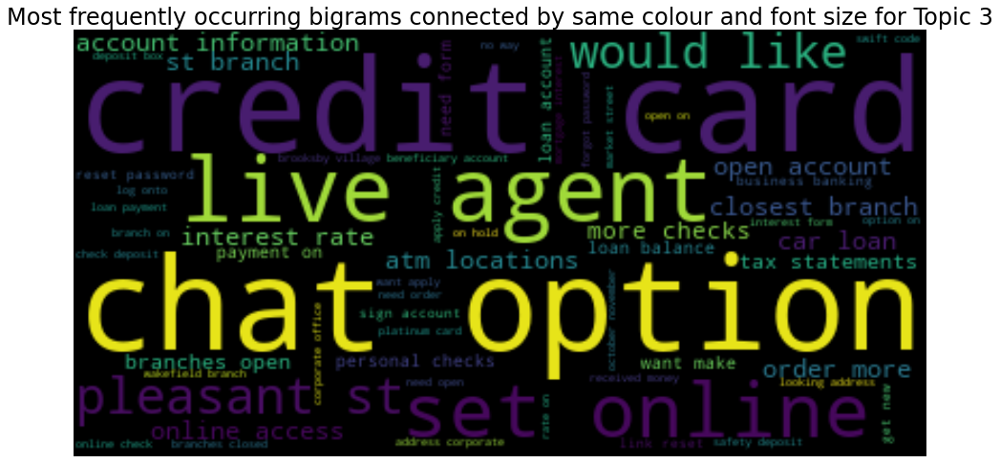

In [67]:
df3 = df[df['Topic'] == 3]
dtm3 = cv.fit_transform(df3['Clean_Comments'])
wf = get_words_freq(dtm3)
plot_cloud("Topic 3", wf, 'topic3')

In [68]:
# map with words this is just a high level pass you'll have to study it more
mytopic_dict = {0:'Online Banking',1:'Accounts',2:'Rates & General',3:'CX & Inquiries'}

df['Topic_Label'] = df['Topic'].map(mytopic_dict)
df.head(10)

,Page,Comments,Clean_Comments,Topic,Topic_Label
0,/business-banking-bill-pay-error,I am enrolled in Bill Pay. It stopped working ...,I am enrolled in Bill Pay It stopped working i...,2,Rates & General
1,/commercial,how do i set up my commercial online banking,how do i set up my commercial online banking,0,Online Banking
2,/credit-card-online-account-access,Credit card account on line login can not do w...,Credit card account on line login can not do w...,0,Online Banking
3,/credit-card-online-account-access,telephone number visa card,telephone number visa card,1,Accounts
4,/customer-service,Account information.,Account information,3,CX & Inquiries
5,/customer-service,Where can I contact you for information on inc...,Where can I contact you for information on inc...,1,Accounts
6,/debit-alerts,Vacation notification,Vacation notification,0,Online Banking
7,/direct-deposit,i needed to speak to someone about ordering de...,i needed to speak to someone about ordering de...,0,Online Banking
8,/eastern-bank-zelle,What is the max $ amount you can send through ...,What is the max $ amount you can send through ...,0,Online Banking
9,/eastern-bank-zelle,What are the transfer limits per day,What are the transfer limits per day,2,Rates & General


In [101]:
# export the df
file_name = plot_dir + '\\' + 'topicTable.csv'
df.to_csv(file_name, index=False)

# 2D Topic Plot

In [69]:
# Generate the TF-IDF vectors
# this is the same step as earlier with the count vectorizer
vectorizer_tfidf = TfidfVectorizer(max_features=10000, ngram_range = (2,2))
vectors_tfidf = vectorizer_tfidf.fit_transform(df.Clean_Comments)
print(vectors_tfidf.shape)

(910, 4029)


In [70]:
# Generate the TF-IDF dimension reduction
embedding_tfidf = umap.UMAP(random_state=SEED).fit_transform(vectors_tfidf)

In [71]:
def enable_plotly_in_cell():
  import IPython
  display(IPython.core.display.HTML('''<script src="/static/components/requirejs/require.js"></script>'''))
  init_notebook_mode(connected=False)

In [72]:
# set up plotting

df['x'] = embedding_tfidf[:,0]
df['y'] = embedding_tfidf[:,1]

# Wrap the text so it displays nicely in Plotly hover
df['wrap'] = df['Comments'].map(lambda x: '<br>'.join(textwrap.wrap(x, 64)))

In [73]:
colors = ['darkblue', 'orange', 'blue', 'green']
topics = list(df['Topic_Label'].unique())

In [74]:
enable_plotly_in_cell()

fig = go.Figure()


for i, topic in enumerate(topics):
    ix = df[df['Topic_Label'] == topic]
    fig.add_trace(go.Scatter(x=ix.x,
                             y=ix.y,
                             name=topic,
                             showlegend=True,
                             mode='markers',
                             marker=dict(
                                 color=colors[i],
                                 size=4,
                                 opacity = 0.6),
                             hovertemplate='Page: ' + ix.Page + '<br>' + 'Topic: ' + ix['Topic_Label'] + '<br>' + 
                             "Comments: " + ix.wrap + '<extra></extra>'
                            ))


   
fig.update_layout(
    autosize=False,
    width=1000,
    height=800,
    hovermode="closest",
    title="Comment Clusters using Bigrams",
    legend_title_text='Topic',
    scene = dict(
        xaxis = dict(title=' ',visible=True, backgroundcolor="rgb(200, 200, 230)", tickvals=[]),
        yaxis = dict(title=' ',visible=True, backgroundcolor="rgb(200, 200, 230)", tickvals=[]),
    ),
    yaxis_range=[-6,5],
    yaxis=dict(showticklabels=False),
    xaxis=dict(showticklabels=False),
    legend=dict(
        orientation="h",
        yanchor="bottom",
        y=1.02,
        xanchor="right",
        x=1)
)

iplot(fig)




In [75]:
file_name = plot_dir + '\\' + 'topicPlot2D.html'
pyo.plot(fig, filename=file_name, auto_open=False)

'C:\\Users\\bbutler\\MyStuff\\MiscMarketing\\WebsiteFeedback\\Plots\\topicPlot2D.html'

# Sentiment Analysis

In [76]:
# instantiate sentiment engine
sid = SentimentIntensityAnalyzer()

In [77]:
# apply the sentiment analyzer
df['Scores'] = df['Clean_Comments'].apply(lambda review: sid.polarity_scores(review))

# compound scores
df['Compound'] = df['Scores'].apply(lambda d:d['compound'])
df.head()

,Page,Comments,Clean_Comments,Topic,Topic_Label,x,y,wrap,Scores,Compound
0,/business-banking-bill-pay-error,I am enrolled in Bill Pay. It stopped working ...,I am enrolled in Bill Pay It stopped working i...,2,Rates & General,3.435721,-1.050283,I am enrolled in Bill Pay. It stopped working ...,"{'neg': 0.103, 'neu': 0.844, 'pos': 0.053, 'co...",-0.7590
1,/commercial,how do i set up my commercial online banking,how do i set up my commercial online banking,0,Online Banking,0.557343,-0.351929,how do i set up my commercial online banking,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",0.0000
2,/credit-card-online-account-access,Credit card account on line login can not do w...,Credit card account on line login can not do w...,0,Online Banking,2.062811,0.350349,Credit card account on line login can not do w...,"{'neg': 0.0, 'neu': 0.809, 'pos': 0.191, 'comp...",0.3818
3,/credit-card-online-account-access,telephone number visa card,telephone number visa card,1,Accounts,1.986809,-5.066177,telephone number visa card,"{'neg': 0.0, 'neu': 0.698, 'pos': 0.302, 'comp...",0.0772
4,/customer-service,Account information.,Account information,3,CX & Inquiries,1.580917,-4.798590,Account information.,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",0.0000


In [78]:
# add some context
# you can choose scores fore neutral (-1 to 1 or something like that)
def sentiment_score(row):
    if row >= .25:
        return 'Pos'
    elif row <= -.25:
        return 'Neg'
    else:
        return "Neu"

# Transformers

In [79]:
# tranformer pipeline for sentiment
from transformers import pipeline

In [80]:
sent_analysis = pipeline("sentiment-analysis")

No model was supplied, defaulted to distilbert-base-uncased-finetuned-sst-2-english (https://huggingface.co/distilbert-base-uncased-finetuned-sst-2-english)


In [81]:
def get_sent_label(text):
    result = sent_analysis(text)[0]
    return result['label']

In [82]:
def get_sent_conf(text):
    result = sent_analysis(text)[0]
    return result['score']

In [83]:
df['Transformer_Label'] = df['Comments'].apply(get_sent_label)
df['Transformer_Conf'] = df['Comments'].apply(get_sent_conf)
df.head()

,Page,Comments,Clean_Comments,Topic,Topic_Label,x,y,wrap,Scores,Compound,Transformer_Label,Transformer_Conf
0,/business-banking-bill-pay-error,I am enrolled in Bill Pay. It stopped working ...,I am enrolled in Bill Pay It stopped working i...,2,Rates & General,3.435721,-1.050283,I am enrolled in Bill Pay. It stopped working ...,"{'neg': 0.103, 'neu': 0.844, 'pos': 0.053, 'co...",-0.7590,NEGATIVE,0.999565
1,/commercial,how do i set up my commercial online banking,how do i set up my commercial online banking,0,Online Banking,0.557343,-0.351929,how do i set up my commercial online banking,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",0.0000,NEGATIVE,0.996917
2,/credit-card-online-account-access,Credit card account on line login can not do w...,Credit card account on line login can not do w...,0,Online Banking,2.062811,0.350349,Credit card account on line login can not do w...,"{'neg': 0.0, 'neu': 0.809, 'pos': 0.191, 'comp...",0.3818,NEGATIVE,0.998949
3,/credit-card-online-account-access,telephone number visa card,telephone number visa card,1,Accounts,1.986809,-5.066177,telephone number visa card,"{'neg': 0.0, 'neu': 0.698, 'pos': 0.302, 'comp...",0.0772,NEGATIVE,0.791163
4,/customer-service,Account information.,Account information,3,CX & Inquiries,1.580917,-4.798590,Account information.,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",0.0000,POSITIVE,0.853706


In [85]:
px_col = ['#E88202', '#04183C', '#E88202', '#04183C']

fig = go.Figure()

for i, sentiment in enumerate(df['Transformer_Label'].unique()):
    df_plot=df[df['Transformer_Label']==sentiment]
    
    fig.add_trace(go.Box(x=df_plot['Topic_Label'],
                         y=df_plot['Transformer_Conf'],
                         notched=False,
                         line=dict(color='blue'),
                         #line=dict(color=colors[i]),
                         #fillcolor='yellow',
                         fillcolor=px_col[i],
                         # line=dict(color = px_col[i]),
                         name = sentiment,
                         
                         ))
    
fig.update_layout(boxmode='group',
                  xaxis_tickangle=0,
                  template="simple_white",
                  yaxis_title='Sentiment Confidence')
fig.show()

# this will save it as a .html file
file_name = plot_dir + '\\' + 'transformer.png'
trans_conf = pyo.plot(fig, filename=file_name, auto_open=False)

In [86]:
sent_df = df[['Page', 'Comments', 'Topic_Label', 'Compound', 'Transformer_Label', 'Transformer_Conf']]

In [87]:
sent_df['Count'] = 1
# get the number of words in comments
sent_df['Word_Count'] = sent_df['Comments'].str.count(' ').add(1)

In [88]:
# make rules to blend sentiment

def blend_sentiment(df):
    if (df['Compound'] < 0 and df['Transformer_Label'] == 'NEGATIVE'):
        return df['Compound']
    elif (df['Compound'] > 0 and df['Transformer_Label'] == 'NEGATIVE'):
        return df['Compound'] * -1
    elif (df['Compound'] == 0 and df['Transformer_Label'] == 'NEGATIVE'):
        return (1 - df['Transformer_Conf'] - (df['Word_Count']/100))
    elif (df['Compound'] > 0 and df['Transformer_Label'] == 'POSITIVE'):
        return df['Compound']
    elif (df['Compound'] == 0 and df['Transformer_Label'] == 'POSITIVE'):
        return (1 - df['Transformer_Conf'] + (df['Word_Count']/100))
    elif (df['Compound'] < 0 and df['Transformer_Label'] == 'POSITIVE'):
        return df['Compound'] + df['Transformer_Conf'] - (df['Word_Count']/100)

In [89]:
# apply the rule

sent_df['Blend_Score'] = sent_df.apply(blend_sentiment, axis = 1)

In [90]:
# rebin the sentiment
sent_df['Blend_Sent'] = sent_df['Blend_Score'].apply(sentiment_score)

In [92]:
# get the counts and roll them up
sent_plot = pd.DataFrame(sent_df.groupby(['Topic_Label', 'Blend_Sent'], as_index=False).aggregate({'Count' : np.sum}))
sent_plot.head(15)

,Topic_Label,Blend_Sent,Count
0,Accounts,Neg,21
1,Accounts,Neu,76
2,Accounts,Pos,7
3,CX & Inquiries,Neg,29
4,CX & Inquiries,Neu,72
5,CX & Inquiries,Pos,4
6,Online Banking,Neg,75
7,Online Banking,Neu,352
8,Online Banking,Pos,169
9,Rates & General,Neg,20


In [93]:
px_col = ['#FF7F24','#2A66DE', '#179110']


fig = px.bar(sent_plot, x="Topic_Label",
             y="Count",
             color="Blend_Sent",
             title="Blended Sentiment by Topic",
                color_discrete_map={
                    'Neg': px_col[0],
                    'Pos': px_col[2],
                    'Neu': px_col[1]})

fig.update_layout(barmode='group',
                  xaxis_tickangle=0,
                  template="simple_white",
                  yaxis_title='Count')

fig.show()

# this will save it as a .html file
file_name = plot_dir + '\\' + 'sentiment'
trans_conf = pyo.plot(fig, filename=file_name, auto_open=False)

# Google Universal Sentence Encoder

In [94]:
text = sent_df['Comments'].to_list()
len(text)

910

In [95]:
# get the sentences
# np_list = np.asarray(sentence_list) and then convert it to tensor using
# tensor_list = tf.convert_to_tensor(np_list)

np_list = np.asarray(text)
sentences = tf.convert_to_tensor(np_list)

In [96]:
# Load the GUSE model
guse = hub.load("https://tfhub.dev/google/universal-sentence-encoder/4")

In [97]:
# encode them all, vectors have a dimension of 512
vectors_guse = guse(sentences)

In [98]:
# Generate the GUSE dimension reductions
embedding_guse = umap.UMAP(random_state=SEED, n_components = 2).fit_transform(vectors_guse)

In [99]:
# Wrap the text so it displays nicely in Plotly hover
sent_df['wrap'] = sent_df['Comments'].map(lambda x: '<br>'.join(textwrap.wrap(x, 64)))

# set up sentiment as z axis
sent_df['x'] = embedding_guse[:,0]
sent_df['y'] = embedding_guse[:,1]
sent_df['z'] = sent_df['Blend_Score']

# set the size
sent_df['Size'] = [10 if x < 5 else x for x in sent_df.Word_Count]

sent_df.head()

,Page,Comments,Topic_Label,Compound,Transformer_Label,Transformer_Conf,Count,Word_Count,Blend_Score,Blend_Sent,wrap,x,y,z,Size
0,/business-banking-bill-pay-error,I am enrolled in Bill Pay. It stopped working ...,Rates & General,-0.7590,NEGATIVE,0.999565,1,146,-0.759000,Neg,I am enrolled in Bill Pay. It stopped working ...,1.485008,-2.856745,-0.759000,146
1,/commercial,how do i set up my commercial online banking,Online Banking,0.0000,NEGATIVE,0.996917,1,9,-0.086917,Neu,how do i set up my commercial online banking,0.722469,-2.696731,-0.086917,9
2,/credit-card-online-account-access,Credit card account on line login can not do w...,Online Banking,0.3818,NEGATIVE,0.998949,1,13,-0.381800,Neg,Credit card account on line login can not do w...,0.309644,-3.404876,-0.381800,13
3,/credit-card-online-account-access,telephone number visa card,Accounts,0.0772,NEGATIVE,0.791163,1,4,-0.077200,Neu,telephone number visa card,-2.171059,-4.170962,-0.077200,10
4,/customer-service,Account information.,CX & Inquiries,0.0000,POSITIVE,0.853706,1,3,0.176294,Neu,Account information.,-1.439655,-3.900414,0.176294,10


In [100]:
enable_plotly_in_cell()

topics = list(sent_df['Topic_Label'].unique())

fig = go.Figure()


for i, topic in enumerate(topics):
    ix = sent_df[sent_df['Topic_Label'] == topic]
    fig.add_trace(go.Scatter3d(x=ix.x,
                               y=ix.y,
                               z=ix.z,
                               name=topic,
                               showlegend=True,
                               mode='markers',
                               marker=dict(
                                   color=colors[i],
                                   size=ix.Size,
                                   opacity = 0.8),
                               hovertemplate='URL: ' + ix.Page + '<br>' + 'Topic: ' + 
                               ix['Topic_Label'] + '<br>' + 'Sentiment: %{z:.2f}' + 
                               '<br>'+ 'Label: ' + ix['Blend_Sent'] + '<br>' + ix.wrap + 
                               '<extra></extra>'
                              ))
   
fig.update_layout(
    autosize=False,
    width=1000,
    height=1000,
    hovermode="closest",
    title="Comment Clusters & Sentiment (Bubble Size based on Num of Words)",
    legend_title_text='Topic',
    scene = dict(
        xaxis = dict(title=' ',visible=True, backgroundcolor="rgb(200, 200, 230)", tickvals=[]),
        yaxis = dict(title=' ',visible=True, backgroundcolor="rgb(200, 200, 230)", tickvals=[]),
        zaxis = dict(title='Sentiment',tickvals=[-1, -.75, -0.5, -0.25, 0, .25, 0.5,.75, 1.0])
    )
)
 
    
fig.update_layout(legend=dict(
    orientation="h",
    yanchor="bottom",
    y=1,
    xanchor="right",
    x=1
))


# this will save it as a .html file
file_name = plot_dir + '\\' + '3DPlot'
trans_conf = pyo.plot(fig, filename=file_name, auto_open=False)

iplot(fig)